In [ ]:
# Machine Translation with LSTM and Attention - PyTorch Version
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch.nn.init as init
import random
import os
import nltk
import io
import string
import re
import csv
from sklearn.model_selection import train_test_split
from collections import Counter
from google.colab import files
from PIL import Image
from torchvision.models import resnet50, ResNet50_Weights
from torch.utils.data import DataLoader, Dataset

nltk.download('punkt_tab', quiet=True)
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Dữ liệu

In [ ]:
main_set_path = "data.csv"

df = pd.read_csv(main_set_path)
print(f"số mẫu dữ liệu main: {len(df)}")

X = df[['image_id', 'question']]
y = df['answer']

class_counts = Counter(y)
print(f"Top 10 answers phổ biến:\n{class_counts.most_common(10)}")

rare_classes = {cls: count for cls, count in class_counts.items() if count < 2}
print(f"Classes hiếm (<2): {len(rare_classes)}")

df_oversampled = df.copy()
for cls in rare_classes:
    rare_df = df[df['answer'] == cls]
    oversampled_rare = rare_df.sample(n=len(rare_df) * 2, replace=True, random_state=42)
    df_oversampled = pd.concat([df_oversampled, oversampled_rare], ignore_index=True)

print(f"Sau oversample: {len(df_oversampled)} samples")

X_train, X_val, y_train, y_val = train_test_split(
    df_oversampled[['image_id', 'question']], df_oversampled['answer'],
    test_size=0.2, random_state=42, stratify=df_oversampled['answer']
)

train_data = []
for idx in range(len(X_train)):
    row = X_train.iloc[idx]
    train_data.append({
        'image_path': row['image_id'],
        'question': row['question'] + '?' if not row['question'].endswith('?') else row['question'],
        'answer': y_train.iloc[idx]
    })

val_data = []
for idx in range(len(X_val)):
    row = X_val.iloc[idx]
    val_data.append({
        'image_path': row['image_id'],
        'question': row['question'] + '?' if not row['question'].endswith('?') else row['question'],
        'answer': y_val.iloc[idx]
    })

print(f"số mẫu dữ liệu train: {len(train_data)}")
print(f"số mẫu dữ liệu val: {len(val_data)}")

số mẫu dữ liệu main: 12468
Top 10 answers phổ biến:
[('2', 554), ('table', 421), ('chair', 367), ('3', 327), ('window', 277), ('white', 259), ('1', 252), ('photo', 252), ('picture', 249), ('cabinet', 245)]
Classes hiếm (<2): 920
Sau oversample: 14308 samples
số mẫu dữ liệu train: 11446
số mẫu dữ liệu val: 2862


## Xử lý câu hỏi

In [ ]:
class QuestionEncoder(nn.Module):
    def __init__(self, vocab_size, embed_dim=100, hidden_dim=512, num_layers=1, dropout=0.5):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=0)
        with torch.no_grad():
            init.xavier_uniform_(self.embedding.weight)# tạo trọng số embedding bằng pp xavier_uniform
            self.embedding.weight[0] = torch.zeros(embed_dim)
            self.embedding.weight[0].requires_grad = False
        self.lstm = nn.LSTM(embed_dim, hidden_dim, num_layers=num_layers,bidirectional=True, dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.output_dim = hidden_dim * 2 # LSTM học câu hỏi ở 2 chều
    def forward(self, question):
        embedded = self.embedding(question)
        embedded = self.dropout(embedded)
        # LSTM
        lstm_out, (hidden, cell) = self.lstm(embedded)
        h_q = torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim=1)  # (batch_size, hidden_dim*2)
        return h_q  # Vector đại diện cho question

## Xử lý hình ảnh

In [ ]:
class ImageEncoder(nn.Module):
    def __init__(self, feature_dim=2048, pretrained=True):
        super().__init__()
        weights = ResNet50_Weights.DEFAULT if pretrained else ResNet50_Weights.IMAGENET1K_V1
        self.resnet = resnet50(weights=weights)

        for param in self.resnet.parameters(): #giữ nguyên các tham số để trích xuất các featues nhanh tiết kiệm thời gian train
            param.requires_grad = False
        for param in self.resnet.layer4.parameters(): #mở lớp cuối cho phép cập nhật trong quá trình trainning giúp trích xuất các đặc trưng quan trọng.
            param.requires_grad = True
        self.resnet.fc = nn.Identity()

    def forward(self, image):
        f_img = self.resnet(image)  # [batch, 2048]
        return f_img

In [ ]:
class VQAModel(nn.Module):
    def __init__(self, question_vocab_size, answer_vocab_size, image_feature_dim=2048, question_hidden_dim=512, fusion_hidden_dim=1024, dropout=0.5):
        super().__init__()
        self.question_encoder = QuestionEncoder(question_vocab_size, hidden_dim=question_hidden_dim)
        self.image_encoder = ImageEncoder(image_feature_dim, pretrained=True)
        self.fusion_dim = image_feature_dim + question_hidden_dim * 2 # 2048 + 1024 = 3072
        self.fusion = nn.Sequential(
            nn.Linear(self.fusion_dim, fusion_hidden_dim), #3072 --> 1024
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(fusion_hidden_dim, fusion_hidden_dim // 2), #1024 --> 512
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(fusion_hidden_dim // 2, answer_vocab_size) #512 --> answer_vocab_size
        )

    def forward(self, image, question):
        f_img = self.image_encoder(image)
        h_q = self.question_encoder(question)
        fused = torch.cat((f_img, h_q), dim=1)
        output = self.fusion(fused)
        return output

In [ ]:
import torch.nn as nn
from torch.nn import MultiheadAttention

class VQAModel(nn.Module):
    def __init__(self, question_vocab_size, answer_vocab_size, image_feature_dim=2048, question_hidden_dim=512, fusion_hidden_dim=1024, num_heads=8, dropout=0.5):
        super().__init__()
        self.question_encoder = QuestionEncoder(question_vocab_size, hidden_dim=question_hidden_dim)
        self.image_encoder = ImageEncoder(image_feature_dim, pretrained=True)

        # Projection to match fusion_hidden_dim for attention
        self.img_proj = nn.Linear(image_feature_dim, fusion_hidden_dim)  # 2048 → 1024
        self.q_proj = nn.Linear(question_hidden_dim * 2, fusion_hidden_dim)  # 1024 → 1024

        # Attention fusion: Query from question, key/value from image
        self.attention = MultiheadAttention(embed_dim=fusion_hidden_dim, num_heads=num_heads, dropout=dropout, batch_first=True)

        # Fusion dim after concat (3 * fusion_hidden_dim = 3072)
        self.fusion_dim = fusion_hidden_dim * 3

        # MLP after attention output
        self.fusion = nn.Sequential(
            nn.Linear(self.fusion_dim, fusion_hidden_dim),  # 3072 → 1024
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(fusion_hidden_dim, fusion_hidden_dim // 2),  # 1024 → 512
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(fusion_hidden_dim // 2, answer_vocab_size)  # 512 → answer_vocab_size
        )

    def forward(self, image, question):
        f_img = self.image_encoder(image)  # [batch, 2048]
        h_q = self.question_encoder(question)  # [batch, 1024]

        # Project to fusion_hidden_dim
        f_img_proj = self.img_proj(f_img)  # [batch, 1024]
        h_q_proj = self.q_proj(h_q)  # [batch, 1024]

        # Reshape for attention (seq_len=1 for vectors)
        f_img_seq = f_img_proj.unsqueeze(1)  # [batch, 1, 1024] (key/value)
        h_q_seq = h_q_proj.unsqueeze(1)  # [batch, 1, 1024] (query)

        # Cross-attention
        attn_output, _ = self.attention(h_q_seq, f_img_seq, f_img_seq)  # [batch, 1, 1024]
        attn_output = attn_output.squeeze(1)  # [batch, 1024]

        # Concat (now 3072 dim)
        fused = torch.cat((h_q_proj, f_img_proj, attn_output), dim=1)  # [batch, 3072]

        output = self.fusion(fused)  # [batch, answer_vocab_size]
        return output

In [ ]:
class VQADataset(Dataset):
    def __init__(self, data_samples, question_vocab=None, answer_vocab=None, max_len=14, num_answers=1000, image_dir='/content/drive/MyDrive/img/'):
        self.data = data_samples
        self.max_len = max_len
        self.image_dir = image_dir
        self.tokenizer = nltk.word_tokenize

        self.transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        if question_vocab is None:
            self.build_question_vocab()
        else:
            self.question_vocab = question_vocab

        if answer_vocab is None:
            self.build_answer_vocab(num_answers)
        else:
            self.answer_vocab = answer_vocab

    def build_question_vocab(self):
        questions = [sample['question'].lower() for sample in self.data]
        all_text = ' '.join(questions)
        tokens = self.tokenizer(all_text)
        counter = Counter(tokens)
        vocab_size = min(10000, len(counter))
        self.question_vocab = {'<PAD>': 0, '<START>': 1, '<END>': 2, '<UNK>': 3}
        self.question_vocab.update({word: idx + 4 for idx, (word, _) in enumerate(counter.most_common(vocab_size - 4))})

    def build_answer_vocab(self, num_answers=1000):
        answers = [sample['answer'].lower() for sample in self.data]
        counter = Counter(answers)
        self.answer_vocab = {'<UNK>': 0}
        self.answer_vocab.update({ans: idx + 1 for idx, (ans, _) in enumerate(counter.most_common(num_answers - 1))})

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample = self.data[idx]

        image_path = os.path.join(self.image_dir, sample['image_path'] + '.png')
        image = Image.open(image_path).convert('RGB')
        image_tensor = self.transform(image)
        question = sample['question'].lower()
        tokens = ['<START>'] + self.tokenizer(question) + ['<END>']

        q_indices = [self.question_vocab.get(token, self.question_vocab['<UNK>']) for token in tokens]
        if len(q_indices) < self.max_len:
            q_indices += [self.question_vocab['<PAD>']] * (self.max_len - len(q_indices))
        else:
            q_indices = q_indices[:self.max_len]
        question_tensor = torch.tensor(q_indices, dtype=torch.long)

        answer_label = self.answer_vocab.get(sample['answer'].lower(), self.answer_vocab['<UNK>'])
        answer_tensor = torch.tensor(answer_label, dtype=torch.long)

        return {
            'image_path': image_tensor,
            'question': question_tensor,
            'answer': answer_tensor
        }


train_dataset = VQADataset(train_data, image_dir='/content/drive/MyDrive/img/')
val_dataset = VQADataset(val_data, question_vocab=train_dataset.question_vocab,
                         answer_vocab=train_dataset.answer_vocab, image_dir='/content/drive/MyDrive/img/')

In [ ]:
batch_size = 256
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Model
question_vocab_size = len(train_dataset.question_vocab)
answer_vocab_size = len(train_dataset.answer_vocab)
model = VQAModel(question_vocab_size, answer_vocab_size).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

num_epochs = 40
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    correct = 0
    total = 0

    for batch in train_loader:
        images = batch['image_path'].to(device)
        questions = batch['question'].to(device)
        answers = batch['answer'].to(device)

        optimizer.zero_grad()
        outputs = model(images, questions)
        loss = criterion(outputs, answers)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += answers.size(0)
        correct += (predicted == answers).sum().item()

    avg_loss = total_loss / len(train_loader)
    accuracy = 100 * correct / total
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%")

    # Val
    if epoch % 2 == 0:
        model.eval()
        val_loss = 0
        val_correct = 0
        val_total = 0
        with torch.no_grad():
            for batch in val_loader:
                images = batch['image_path'].to(device)
                questions = batch['question'].to(device)
                answers = batch['answer'].to(device)
                outputs = model(images, questions)
                val_loss += criterion(outputs, answers).item()
                _, predicted = torch.max(outputs, 1)
                val_total += answers.size(0)
                val_correct += (predicted == answers).sum().item()
        print(f"Val Loss: {val_loss / len(val_loader):.4f}, Val Accuracy: {100 * val_correct / val_total:.2f}%")

# Save
torch.save(model.state_dict(), 'vqa_fusion_model.pth')
print("Fusion model saved!")

Epoch 1/40, Loss: 5.6893, Accuracy: 6.10%
Val Loss: 5.0817, Val Accuracy: 4.40%
Epoch 2/40, Loss: 5.1174, Accuracy: 10.19%
Epoch 3/40, Loss: 4.7256, Accuracy: 13.08%
Val Loss: 4.3341, Val Accuracy: 19.85%
Epoch 4/40, Loss: 4.4039, Accuracy: 15.60%
Epoch 5/40, Loss: 4.1138, Accuracy: 17.39%
Val Loss: 3.8973, Val Accuracy: 22.26%
Epoch 6/40, Loss: 3.8737, Accuracy: 19.86%
Epoch 7/40, Loss: 3.6626, Accuracy: 21.96%
Val Loss: 3.6468, Val Accuracy: 23.65%
Epoch 8/40, Loss: 3.4354, Accuracy: 24.01%
Epoch 9/40, Loss: 3.1936, Accuracy: 26.55%
Val Loss: 3.4276, Val Accuracy: 24.21%
Epoch 10/40, Loss: 2.9993, Accuracy: 29.56%
Epoch 11/40, Loss: 2.7748, Accuracy: 32.29%
Val Loss: 3.2618, Val Accuracy: 28.51%
Epoch 12/40, Loss: 2.6081, Accuracy: 34.97%
Epoch 13/40, Loss: 2.4358, Accuracy: 38.28%
Val Loss: 3.1652, Val Accuracy: 31.69%
Epoch 14/40, Loss: 2.3069, Accuracy: 40.14%
Epoch 15/40, Loss: 2.1594, Accuracy: 43.06%
Val Loss: 3.1500, Val Accuracy: 33.61%
Epoch 16/40, Loss: 2.0513, Accuracy: 45

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = VQAModel(
    question_vocab_size=len(train_dataset.question_vocab),
    answer_vocab_size=len(train_dataset.answer_vocab),
    image_feature_dim=2048,
    question_hidden_dim=512,
    fusion_hidden_dim=1024
).to(device)

state_dict = torch.load("vqa_fusion_model.pth", map_location=device)
model.load_state_dict(state_dict)
model.eval()


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 271MB/s]


VQAModel(
  (question_encoder): QuestionEncoder(
    (embedding): Embedding(1017, 300, padding_idx=0)
    (lstm): LSTM(300, 512, batch_first=True, bidirectional=True)
    (dropout): Dropout(p=0.5, inplace=False)
  )
  (image_encoder): ImageEncoder(
    (resnet): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=

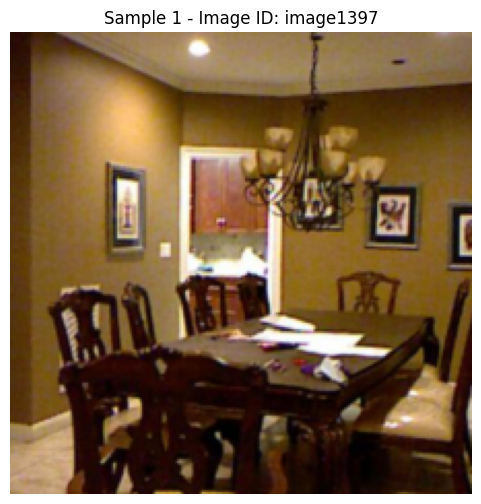

Sample 1
image: image1397
Question: <START> how many frames are there on the wall ? <END> <PAD> <PAD> <PAD>
Predicted Answer: 3
True Answer: 3
--------------------------------------------------


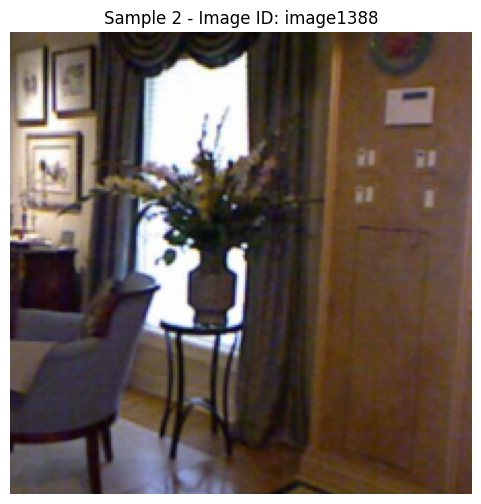

Sample 2
image: image1388
Question: <START> what is to the left of the cardboard ? <END> <PAD> <PAD> <PAD>
Predicted Answer: cabinet
True Answer: window
--------------------------------------------------


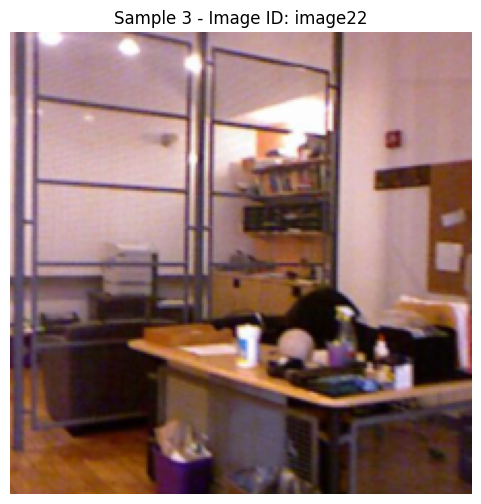

Sample 3
image: image22
Question: <START> what color is the paper holder on the right side of the water
Predicted Answer: purple
True Answer: black
--------------------------------------------------


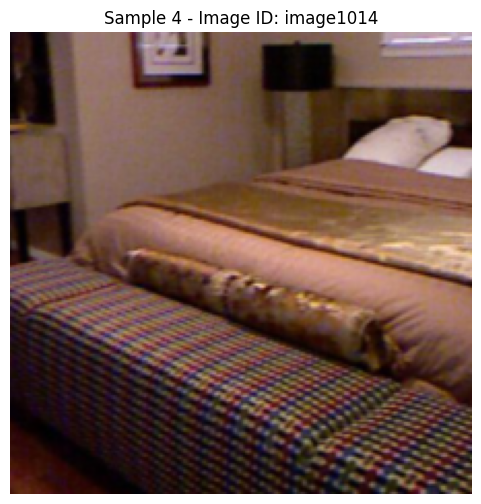

Sample 4
image: image1014
Question: <START> what is the object close to the wall ? <END> <PAD> <PAD> <PAD>
Predicted Answer: wall_decoration
True Answer: picture
--------------------------------------------------


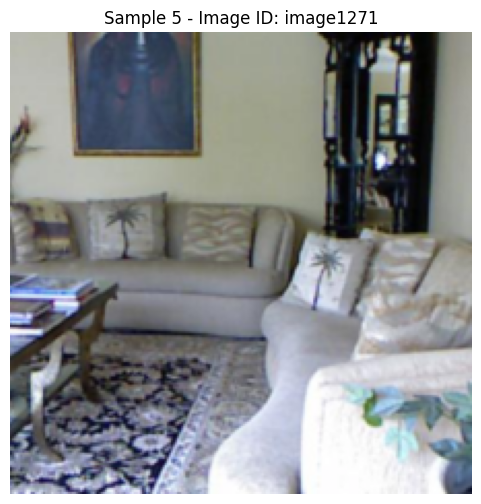

Sample 5
image: image1271
Question: <START> what is the wall to the right of the plant pot ? <END>
Predicted Answer: mirror
True Answer: light_switch
--------------------------------------------------


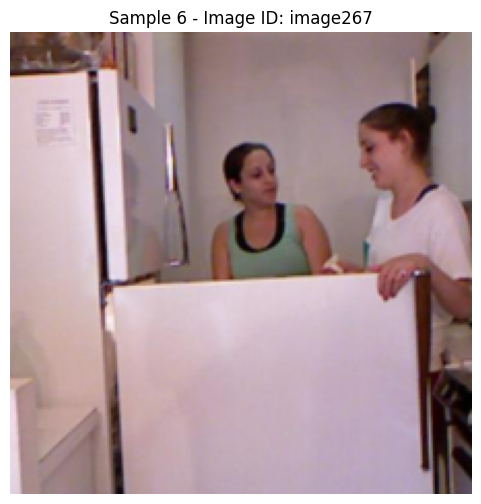

Sample 6
image: image267
Question: <START> what is largest object ? <END> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: bottle
True Answer: refridgerator
--------------------------------------------------


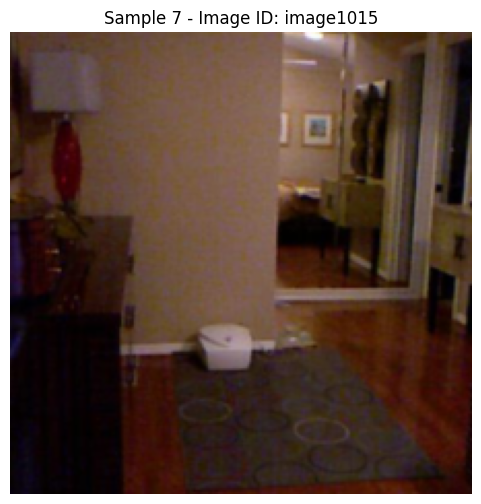

Sample 7
image: image1015
Question: <START> what is on the drawer shelf ? <END> <PAD> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: box
True Answer: <UNK>
--------------------------------------------------


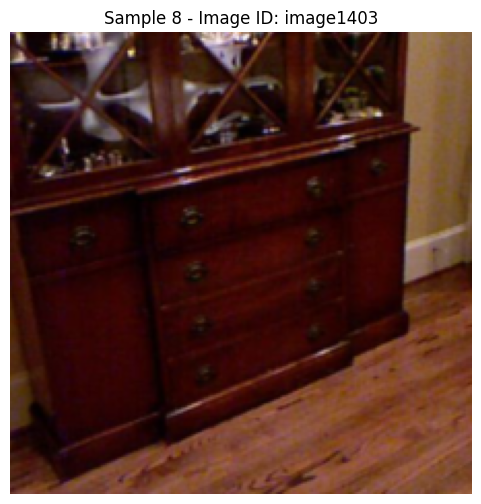

Sample 8
image: image1403
Question: <START> what is on the right side of the switch board ? <END> <PAD>
Predicted Answer: door
True Answer: door
--------------------------------------------------


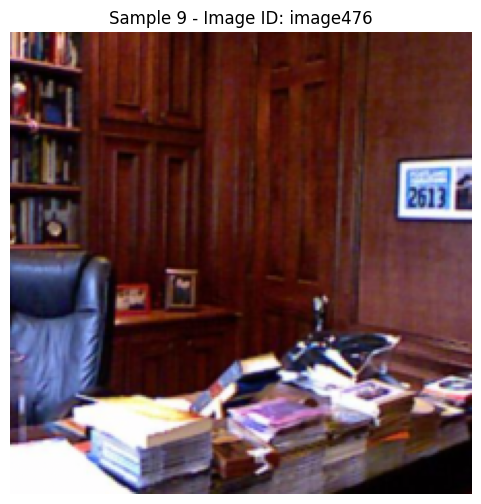

Sample 9
image: image476
Question: <START> what are the objects on the table ? <END> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: books
True Answer: <UNK>
--------------------------------------------------


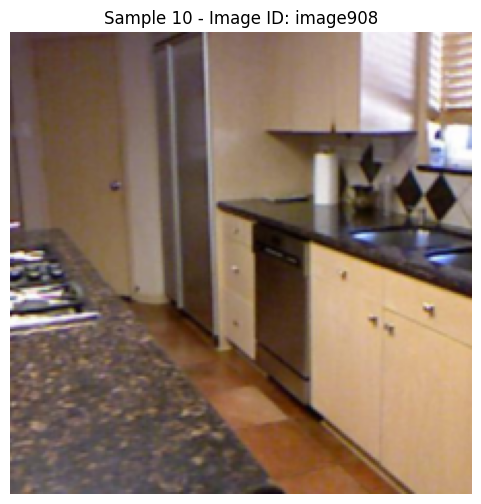

Sample 10
image: image908
Question: <START> what is the object close to the middle counter table ? <END> <PAD>
Predicted Answer: stove
True Answer: stove
--------------------------------------------------


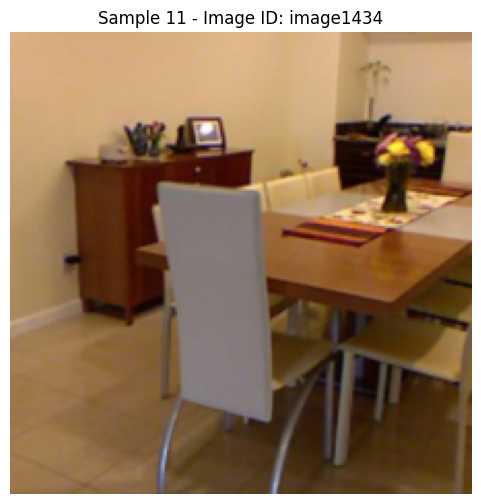

Sample 11
image: image1434
Question: <START> what is found near the wall ? <END> <PAD> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: table
True Answer: cabinet
--------------------------------------------------


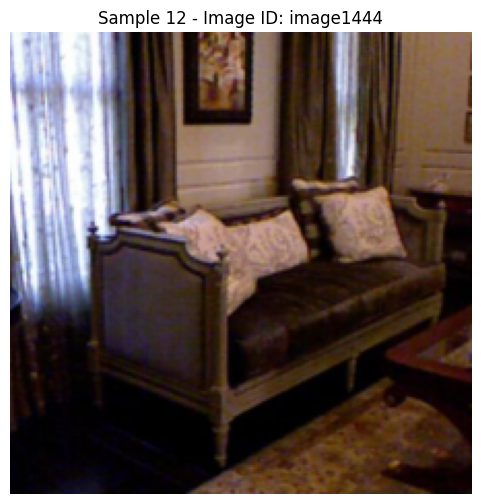

Sample 12
image: image1444
Question: <START> what is to the left of the mantel ? <END> <PAD> <PAD> <PAD>
Predicted Answer: coffee_table
True Answer: sofa
--------------------------------------------------


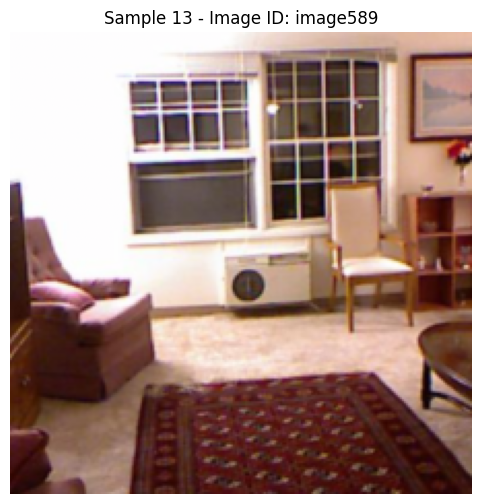

Sample 13
image: image589
Question: <START> what is placed on the table ? <END> <PAD> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: vase
True Answer: box
--------------------------------------------------


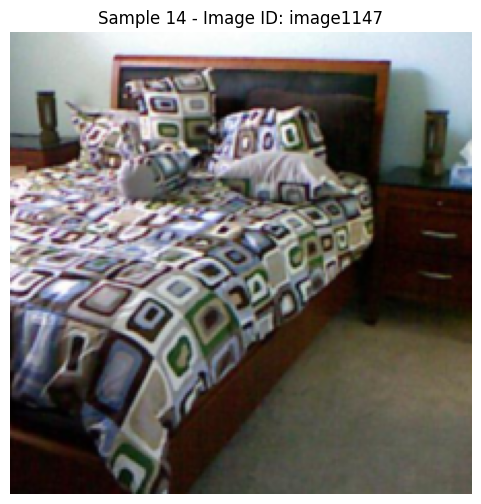

Sample 14
image: image1147
Question: <START> what are the objects on the bed ? <END> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: pillow, blanket
True Answer: pillow, blanket
--------------------------------------------------


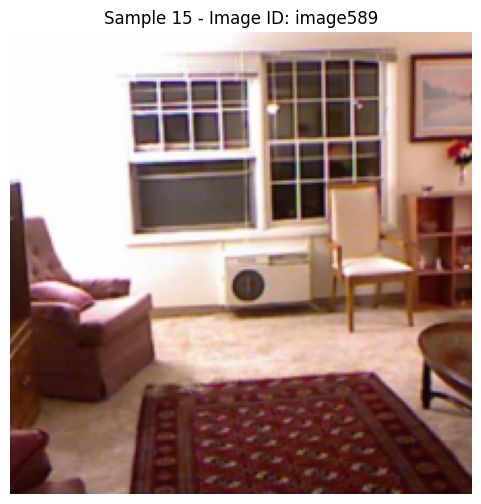

Sample 15
image: image589
Question: <START> what is on the left side of the chair ? <END> <PAD> <PAD>
Predicted Answer: picture
True Answer: air_conditioner
--------------------------------------------------


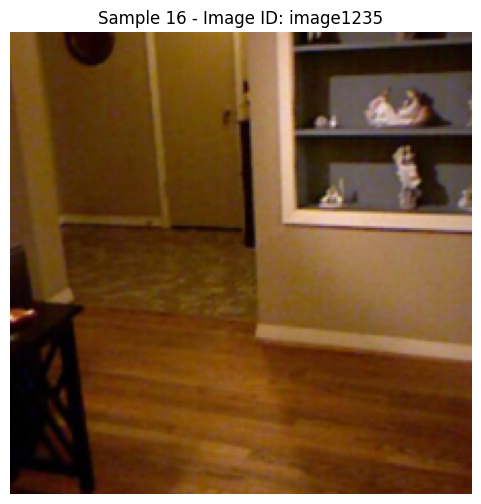

Sample 16
image: image1235
Question: <START> what are the things on the table right to the sofa ? <END>
Predicted Answer: toy
True Answer: lamp, photo
--------------------------------------------------


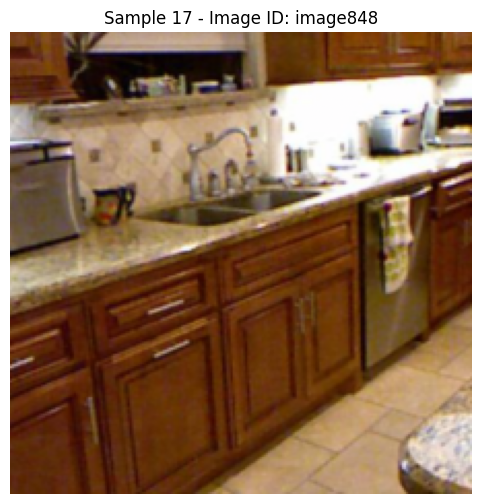

Sample 17
image: image848
Question: <START> what is found in front of the window ? <END> <PAD> <PAD> <PAD>
Predicted Answer: vase
True Answer: sink
--------------------------------------------------


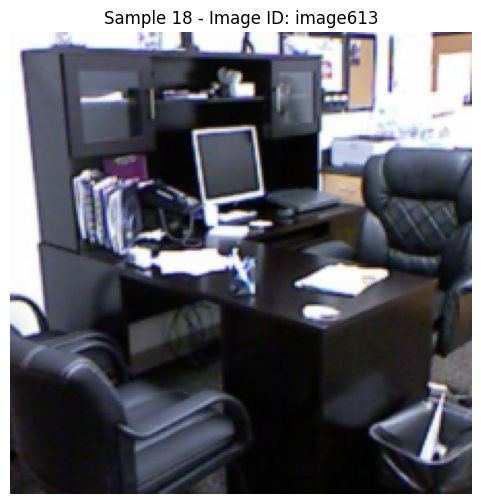

Sample 18
image: image613
Question: <START> what is the object on the floor right of the table ? <END>
Predicted Answer: garbage_bin
True Answer: garbage_bin
--------------------------------------------------


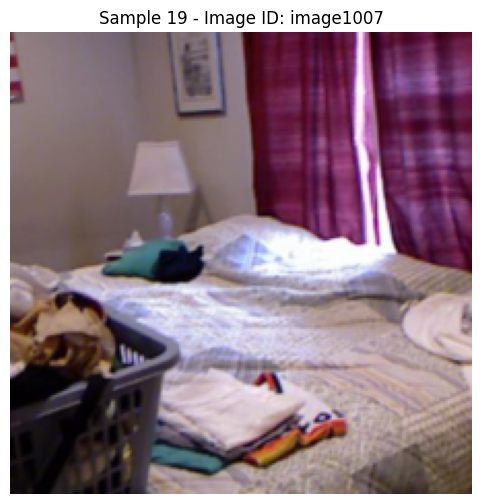

Sample 19
image: image1007
Question: <START> what is the object close to the wall ? <END> <PAD> <PAD> <PAD>
Predicted Answer: wall_decoration
True Answer: picture
--------------------------------------------------


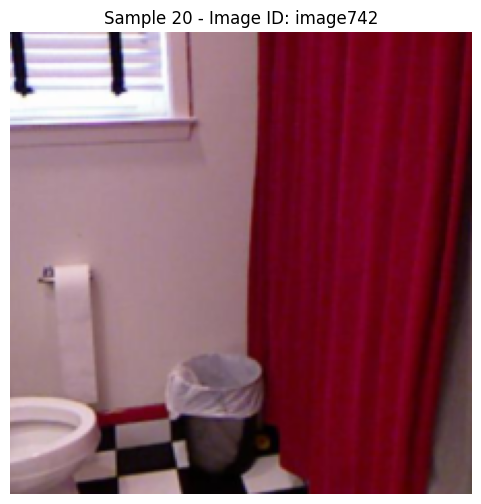

Sample 20
image: image742
Question: <START> what is the colour of the curtains ? <END> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: red
True Answer: red
--------------------------------------------------


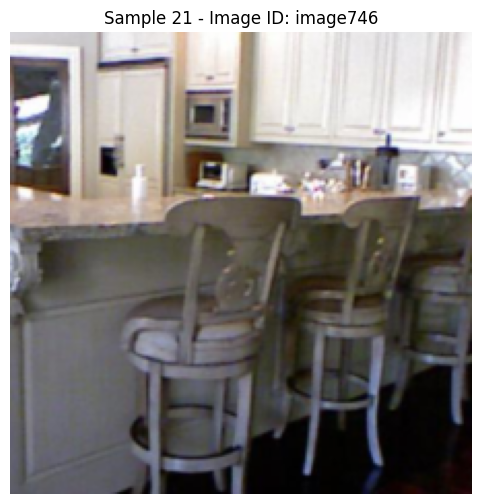

Sample 21
image: image746
Question: <START> how many bottles on wooden desk ? <END> <PAD> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: 4
True Answer: 1
--------------------------------------------------


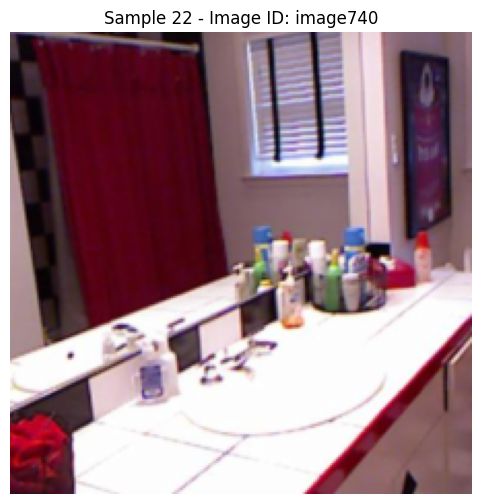

Sample 22
image: image740
Question: <START> what is on the wall ? <END> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: picture
True Answer: picture
--------------------------------------------------


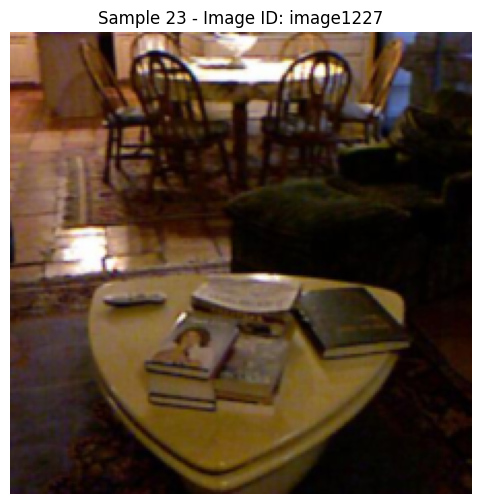

Sample 23
image: image1227
Question: <START> what is in front of the sofa ? <END> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: table
True Answer: coffee_table
--------------------------------------------------


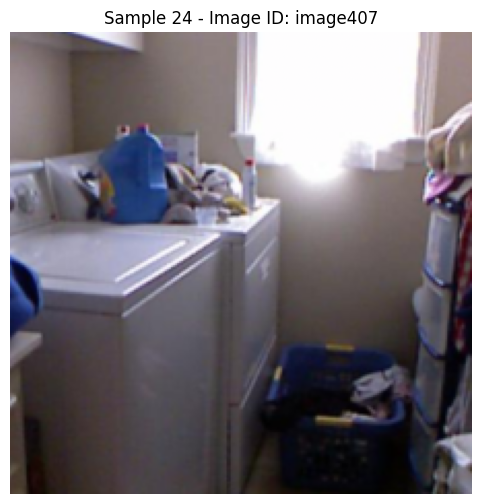

Sample 24
image: image407
Question: <START> what is on the right side of the laundry basket ? <END> <PAD>
Predicted Answer: laundry_basket
True Answer: stand
--------------------------------------------------


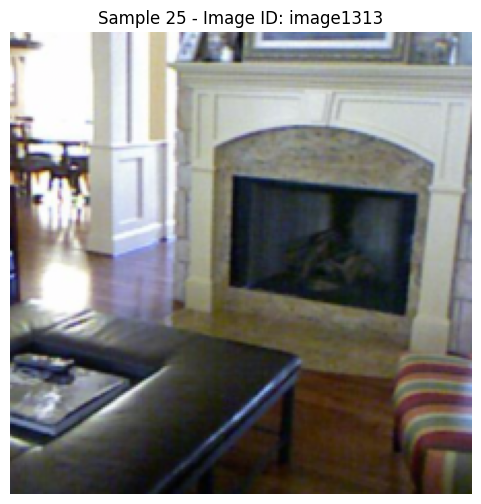

Sample 25
image: image1313
Question: <START> what is to the right of the table ? <END> <PAD> <PAD> <PAD>
Predicted Answer: fireplace
True Answer: chair
--------------------------------------------------


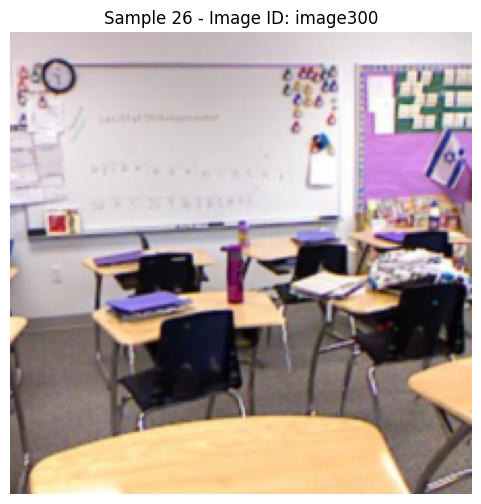

Sample 26
image: image300
Question: <START> what is the colour of chair ? <END> <PAD> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: black
True Answer: black
--------------------------------------------------


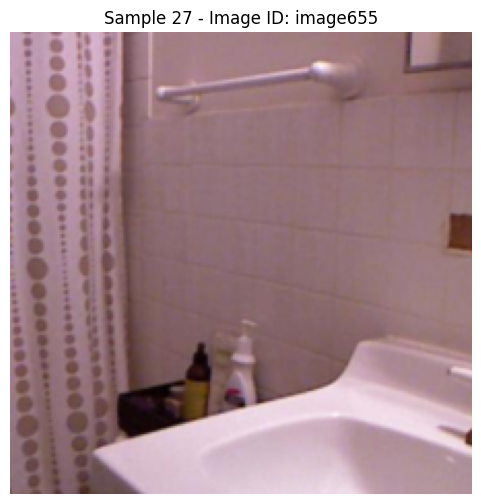

Sample 27
image: image655
Question: <START> what is on the right side of the bottle of liquid ? <END>
Predicted Answer: bottle_of_liquid, bottle
True Answer: sink
--------------------------------------------------


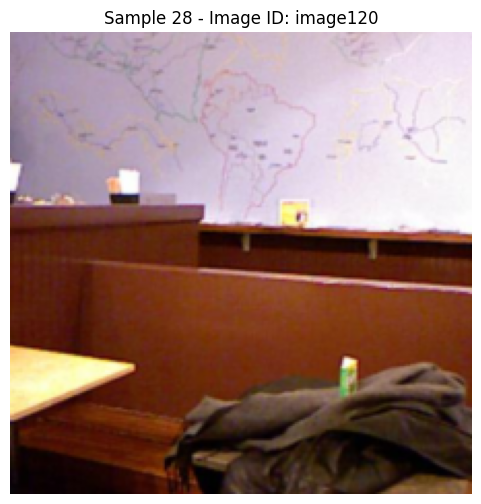

Sample 28
image: image120
Question: <START> what is on the coffee table ? <END> <PAD> <PAD> <PAD> <PAD> <PAD>
Predicted Answer: <UNK>
True Answer: jacket
--------------------------------------------------


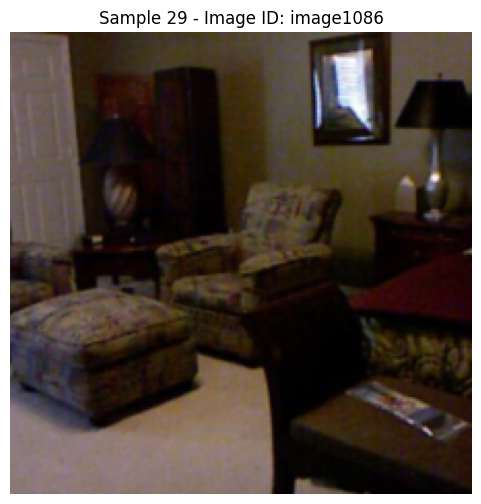

Sample 29
image: image1086
Question: <START> what is on the table <UNK> to the bed ? <END> <PAD> <PAD>
Predicted Answer: lamp
True Answer: <UNK>
--------------------------------------------------


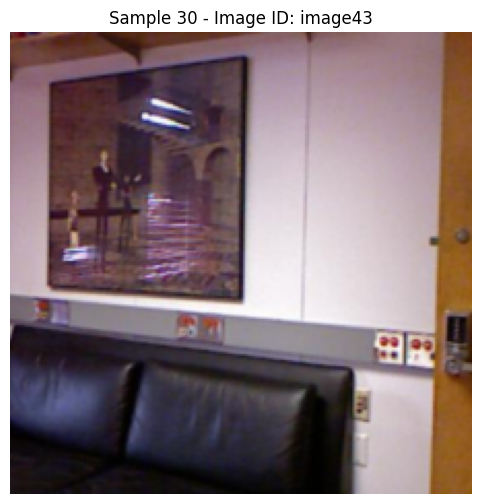

Sample 30
image: image43
Question: <START> what are objects on the top most shelves close to the wall ?
Predicted Answer: photo
True Answer: books
--------------------------------------------------


In [ ]:
model.eval()
idx2answer = {v: k for k, v in train_dataset.answer_vocab.items()}
idx2word = {v: k for k, v in train_dataset.question_vocab.items()}

with torch.no_grad():
    for i in range(30):
        sample = val_dataset[i]
        img = val_data[i]


        image = sample['image_path'].unsqueeze(0).to(device)
        question = sample['question'].unsqueeze(0).to(device)
        true_answer = sample['answer'].item()

        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(device)
        image_display = image.squeeze(0).cpu() * std + mean  # Denormalize
        image_display = torch.clamp(image_display, 0, 1)

        output = model(image, question)
        pred_idx = output.argmax(dim=1).item()


        pred_answer = idx2answer.get(pred_idx, "<UNK>")
        true_answer_text = idx2answer.get(true_answer, "<UNK>")
        question_text = " ".join([idx2word.get(tok.item(), "<UNK>") for tok in sample['question'] if tok.item() in idx2word])

        plt.figure(figsize=(6, 6))
        plt.imshow(image_display.permute(1, 2, 0).numpy())  # Permute cho HWC
        plt.axis('off')
        plt.title(f"Sample {i+1} - Image ID: {img['image_path']}")
        plt.show()

        print(f"Sample {i+1}")
        print("image:",img["image_path"])
        print("Question:", question_text)
        print("Predicted Answer:", pred_answer)
        print("True Answer:", true_answer_text)
        print("-"*50)



In [ ]:
model.eval()
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
total_correct = 0
total_samples = 0

with torch.no_grad():
    for batch in val_loader:
        images = batch['image_path'].to(device)
        questions = batch['question'].to(device)
        answers = batch['answer'].to(device)

        outputs = model(images, questions)
        predicted = outputs.argmax(dim=1)

        total_correct += (predicted == answers).sum().item()
        total_samples += answers.size(0)

# Calculate Top-1 Accuracy
top1_accuracy = (total_correct / total_samples) * 100 if total_samples > 0 else 0
print(f"Top-1 Accuracy on Validation Set: {top1_accuracy:.2f}% ({total_correct}/{total_samples} correct)")